# Airbnb Project

04/24/2021


In [1]:
#!pip install plotly
#!pip install chart-studio

In [2]:
import pandas as pd
import chart_studio.plotly as py
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
import plotly.figure_factory as ff
import numpy as np
import scipy


In [3]:
df_pre_cleaned = pd.read_csv("df_pre_clean.csv")
df_post_cleaned = pd.read_csv("df_post_clean.csv")

In [4]:
df_pre_cleaned.head(6)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,postcode,rich,borough
0,2595,Skylit Midtown Castle,2845,Jennifer,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1,45,2019-05-21,0.38,2,355,10018,1.0,Manhattan
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1,270,2019-07-05,4.64,1,194,11238,0.0,Brooklyn
2,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Murray Hill,40.74767,-73.97500,Entire home/apt,200.0,3,74,2019-06-22,0.59,1,129,10016,0.0,Manhattan
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Hell's Kitchen,40.76489,-73.98493,Private room,79.0,2,430,2019-06-24,3.47,1,220,10019,0.0,Manhattan
4,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Chinatown,40.71344,-73.99037,Entire home/apt,150.0,1,160,2019-06-09,1.33,4,188,10002,0.0,Manhattan
5,5295,Beautiful 1br on Upper West Side,7702,Lena,Upper West Side,40.80316,-73.96545,Entire home/apt,135.0,5,53,2019-06-22,0.43,1,6,10025,0.0,Manhattan


In [5]:
df_post_cleaned.head(6)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,postcode,rich,borough
0,3831,"Whole flr w/private bdrm, bath & kitchen(pls r...",4869,LisaRoxanne,"Brooklyn, New York, United States",40.68514,-73.95976,Entire home/apt,77.0,1,364,10/19/2020,4.90,1,279,11238,0.0,Brooklyn
1,5178,Large Furnished Room Near B'way,8967,Shunichi,"New York, United States",40.76468,-73.98315,Private room,65.0,2,474,9/25/2020,3.39,1,347,10019,0.0,Manhattan
2,5803,"Lovely Room 1, Garden, Best Area, Legal rental",9744,Laurie,"Brooklyn, New York, United States",40.66829,-73.98779,Private room,84.0,4,182,10/17/2020,1.30,3,365,11215,0.0,Brooklyn
3,6848,Only 2 stops to Manhattan studio,15991,Allen & Irina,NaN,40.70837,-73.95352,Entire home/apt,109.0,30,181,3/16/2020,1.30,1,0,11211,0.0,Brooklyn
4,7097,Perfect for Your Parents + Garden; Germ-Free,17571,Jane,"Brooklyn, New York, United States",40.69121,-73.97277,Entire home/apt,191.0,2,234,10/31/2020,1.78,2,337,11205,0.0,Brooklyn
5,8490,"MAISON DES SIRENES1,bohemian apartment",25183,Nathalie,NaN,40.68371,-73.94028,Entire home/apt,120.0,2,116,9/7/2020,0.85,2,352,11221,0.0,Brooklyn


In [6]:
#combine the two data sets of df_pre_cleaned and df_post_cleaned
df_pre_cleaned2 = df_pre_cleaned.copy()
df_post_cleaned2 = df_post_cleaned.copy()
df_pre_cleaned2["before_pandemic"]= '1'
#df_pre
df_post_cleaned2["before_pandemic"]= '0'
#df_post
frames = [df_pre_cleaned2, df_post_cleaned2]

In [7]:
#combining data frames for pre and post pandemic
df_merged_cleaned = pd.concat(frames)
df_merged_cleaned["price"]=df_merged_cleaned["price"].astype("float")
df_merged_cleaned

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,postcode,rich,borough,before_pandemic
0,2595,Skylit Midtown Castle,2845,Jennifer,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1,45,2019-05-21,0.38,2,355,10018,1.0,Manhattan,1
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1,270,2019-07-05,4.64,1,194,11238,0.0,Brooklyn,1
2,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Murray Hill,40.74767,-73.97500,Entire home/apt,200.0,3,74,2019-06-22,0.59,1,129,10016,0.0,Manhattan,1
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Hell's Kitchen,40.76489,-73.98493,Private room,79.0,2,430,2019-06-24,3.47,1,220,10019,0.0,Manhattan,1
4,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Chinatown,40.71344,-73.99037,Entire home/apt,150.0,1,160,2019-06-09,1.33,4,188,10002,0.0,Manhattan,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16330,46035129,"""Beautiful Traveler Room"" Brooklyn Medical Stu...",366283494,Alice,"Brooklyn, New York, United States",40.62603,-74.00774,Private room,39.0,1,2,10/30/2020,2.00,4,356,11219,0.0,Brooklyn,0
16331,46038559,Retreat in the City: Private Bedroom In UWS,373077389,Edwin,"New York, United States",40.80155,-73.96383,Private room,72.0,1,2,10/30/2020,2.00,2,180,10025,0.0,Manhattan,0
16332,46039283,Luxury & Iconic 1B Condo in the center of Midtown,45152252,Kelvin,"New York, United States",40.76504,-73.99016,Entire home/apt,189.0,1,1,10/30/2020,1.00,1,7,10019,0.0,Manhattan,0
16333,46140657,It's a Beautiful Day in Bed-Stuy! 2,19536596,Andrew,"Brooklyn, New York, United States",40.67763,-73.90612,Private room,55.0,1,1,11/2/2020,1.00,2,269,11233,0.0,Brooklyn,0


In [8]:
#(df_merged_cleaned.price)

In [9]:
# remove duplicate hosts
df_hosts = df_merged_cleaned[~df_merged_cleaned.host_id.duplicated()]
hosts = df_hosts.calculated_host_listings_count


In [10]:
#all hosts, pre and post pandemic merged
hosts=hosts.astype("float")
hosts

0        2.0
1        1.0
2        1.0
3        1.0
4        4.0
        ... 
16326    1.0
16327    1.0
16329    2.0
16332    1.0
16334    1.0
Name: calculated_host_listings_count, Length: 23820, dtype: float64

Now we isolate the data for our first hypothesis test, mean listings per host for rich neighborhoods:

In [11]:
#isolate first sample, pre hosts who have listings in rich neighborhoods
df_pre_hosts = df_pre_cleaned[~df_pre_cleaned.host_id.duplicated()]
df_pre_hosts_rich = df_pre_hosts.loc[(df_pre_hosts['rich']==1.0)]
df_pre_hosts_rich["before_pandemic"]= '1'
pre_hosts_rich = df_pre_hosts_rich.calculated_host_listings_count

In [12]:
df_pre_hosts_rich

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,postcode,rich,borough,before_pandemic
0,2595,Skylit Midtown Castle,2845,Jennifer,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1,45,2019-05-21,0.38,2,355,10018,1.0,Manhattan,1
30,12318,West Side Retreat,16800,Cyn,Upper West Side,40.79009,-73.97927,Private room,135.0,4,81,2019-06-16,0.69,1,273,10024,1.0,Manhattan,1
37,14287,Cozy 1BD on Central Park West in New York City,56094,Joya,Upper West Side,40.78635,-73.97008,Entire home/apt,151.0,2,73,2019-07-07,0.63,1,302,10024,1.0,Manhattan,1
43,15220,Best Location in NYC! TIMES SQUARE!,59734,Luiz,Hell's Kitchen,40.75531,-73.99293,Private room,69.0,2,289,2019-06-09,2.49,2,294,10018,1.0,Manhattan,1
47,15711,2 bedroom - Upper East Side-great for kids,61491,D,Upper East Side,40.77065,-73.95269,Entire home/apt,250.0,2,66,2019-03-30,0.57,2,231,10075,1.0,Manhattan,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25098,36224876,Upper East Side Apt By The Water,46232598,Caitlin,Upper East Side,40.77001,-73.94915,Entire home/apt,150.0,1,1,2019-07-01,1.00,1,130,10075,1.0,Manhattan,1
25110,36242888,Upper East Site Luxury 2 Bed rooms,12579773,Jean-Nicolas,Upper East Side,40.76996,-73.95117,Private room,220.0,4,1,2019-07-03,1.00,1,15,10021,1.0,Manhattan,1
25112,36273046,Elegant Spacious UES private room,267839371,Celine,Upper East Side,40.77551,-73.95404,Private room,120.0,1,1,2019-07-06,1.00,2,358,10028,1.0,Manhattan,1
25113,36274037,Cozy Wall Street Studio,272816114,Schmid,Financial District,40.70583,-74.01038,Entire home/apt,170.0,1,1,2019-07-06,1.00,1,323,10005,1.0,Manhattan,1


In [13]:
#isolate second sample, post hosts who have listings in rich neighborhoods
df_post_hosts = df_post_cleaned[~df_post_cleaned.host_id.duplicated()] 
df_post_hosts_rich = df_post_hosts.loc[(df_post_hosts['rich']==1.0)]
df_post_hosts_rich["before_pandemic"]= '0'

post_hosts_rich = df_post_hosts_rich.calculated_host_listings_count

In [14]:
df_post_hosts_rich

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,postcode,rich,borough,before_pandemic
18,15711,2 bedroom Upper East Side,61491,D,"New York, United States",40.77065,-73.95269,Entire home/apt,173.0,2,83,7/8/2020,0.63,2,76,10075,1.0,Manhattan,0
37,26362,"Times Square, Safe, Clean and Cozy!",59734,Luiz,NaN,40.75527,-73.99291,Private room,76.0,2,374,2/27/2020,2.93,1,346,10018,1.0,Manhattan,0
44,29683,Stylish & Sleek Apartment Near SoHo!,125857,Uli,"New York, United States",40.72392,-73.99143,Entire home/apt,132.0,5,109,10/17/2020,0.86,1,318,10013,1.0,Manhattan,0
54,33156,"Sunny, Clean Zen Home w pr.Bath",128669,Alex,"New York, United States",40.78849,-73.96883,Entire home/apt,150.0,120,20,10/14/2020,0.17,1,365,10024,1.0,Manhattan,0
57,39267,CENTRAL PARK LOFT all for YOU,168417,Marie,NaN,40.77456,-73.95323,Entire home/apt,99.0,1,264,10/4/2020,2.49,2,314,10028,1.0,Manhattan,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16263,45721885,Private Bedroom in Manhattan New York City,370601452,Liana,NaN,40.71718,-73.99742,Private room,65.0,3,1,10/19/2020,1.00,1,145,10013,1.0,Manhattan,0
16274,45754095,Cozy Apartment in Manhattan,49618416,Hanói,NaN,40.76831,-73.95480,Entire home/apt,115.0,3,1,10/14/2020,1.00,3,320,10021,1.0,Manhattan,0
16279,45757633,The Wall Street Experience,370962749,Lawrence,NaN,40.70876,-74.01035,Private room,60.0,1,2,10/25/2020,2.00,1,8,10005,1.0,Manhattan,0
16282,45766243,Modern Upper East Side 1 BR (Close to CentralP...,29131657,Othman,"New York, United States",40.76188,-73.96364,Entire home/apt,160.0,4,1,10/16/2020,1.00,1,14,10065,1.0,Manhattan,0


In [15]:
#combine the two data sets of df_pre_cleaned and df_post_cleaned for rich neighborhoods, 
#with the column of before_pandemic denoting before_pandemic = 1 if pre-pandemic and 0 for post-pandemic
df_pre_hosts_rich3 = df_pre_hosts_rich.copy()
df_post_hosts_rich3 = df_post_hosts_rich.copy()
frames = [df_pre_hosts_rich3, df_post_hosts_rich3]

In [84]:
df_merged_rich_hosts2 = pd.concat(frames)
#df_merged_rich_hosts2

In [17]:
df_merged_rich_hosts2.to_csv(r'C:\Users\kulra\Desktop\df_merged_hosts_rich_R.csv', index = False, header=True)

In [18]:
pre_hosts_rich=pre_hosts_rich.astype("float")
pre_hosts_rich

0        2.0
30       1.0
37       1.0
43       2.0
47       2.0
        ... 
25098    1.0
25110    1.0
25112    2.0
25113    1.0
25120    1.0
Name: calculated_host_listings_count, Length: 1169, dtype: float64

In [19]:
post_hosts_rich=post_hosts_rich.astype("float")
post_hosts_rich

18       2.0
37       1.0
44       1.0
54       1.0
57       2.0
        ... 
16263    1.0
16274    3.0
16279    1.0
16282    1.0
16289    1.0
Name: calculated_host_listings_count, Length: 693, dtype: float64

In [20]:
#combine the two data sets of df_pre_cleaned and df_post_cleaned for rich neighborhoods
df_pre_hosts_rich2 = pre_hosts_rich.copy()
df_post_hosts_rich2 = post_hosts_rich.copy()
frames = [df_pre_hosts_rich2, df_post_hosts_rich2]

In [21]:
df_merged_rich_hosts = pd.concat(frames)
df_merged_rich_hosts

0        2.0
30       1.0
37       1.0
43       2.0
47       2.0
        ... 
16263    1.0
16274    3.0
16279    1.0
16282    1.0
16289    1.0
Name: calculated_host_listings_count, Length: 1862, dtype: float64

# Hypothesis Test 1:

## We would like to determine whether rich neighborhood mean listings per host are greater after the pandemic than before. 



###  Hypotheses: $$H_0: F_1(x) = F_2(x)$$ $$ H_A: F_1(x) \geq F_2(x),$$
where $F_1(X)$ is the distribution for group 1: rich neighborhood mean listings per host pre pandemic, and $F_2(x)$ is the distribution for group 2: rich neighborhood mean listings per host post-pandemic. 

####  Let us test for assumptions of parametric two sample test. From the below distribution of the rich neighborhood calculated host listings (with no duplicate host ids), it is clear that the data is not Normal in shape, is asymmetric, and has heavy tails.

In [125]:
trace = go.Histogram(
    x=df_merged_rich_hosts
)
iplot([trace], filename='normality-histogram')


We will also display a QQ-Plot:

In [23]:
from statsmodels.graphics.gofplots import qqplot

qqplot_data = qqplot(df_merged_rich_hosts, line='s').gca().lines

#### From the QQ-Plot below we see a very heavy tail which includes several outliers that appear influential.

In [132]:
fig = go.Figure()

fig.add_trace({
    'type': 'scatter',
    'x': qqplot_data[0].get_xdata(),
    'y': qqplot_data[0].get_ydata(),
    'mode': 'markers',
    'marker': {
        'color': '#19d3f3'
    }
})

fig.add_trace({
    'type': 'scatter',
    'x': qqplot_data[1].get_xdata(),
    'y': qqplot_data[1].get_ydata(),
    'mode': 'lines',
    'line': {
        'color': '#636efa'
    }

})


fig['layout'].update({
    'title': 'Quantile-Quantile Plot: Rich Neighborhoods',
    'xaxis': {
        'title': 'Theoritical Quantities',
        'zeroline': False
    },
    'yaxis': {
        'title': 'Sample Quantities'
    },
    'showlegend': False,
    'width': 800,
    'height': 700,
})


iplot(fig, filename='normality-QQ')

#### Let us now test for Normality using Shapiro-Wilkes Test:

In [25]:
from scipy.stats import shapiro
stat, p = shapiro(df_merged_rich_hosts)

# interpret
alpha = 0.05
if p > alpha:
    msg = 'Sample looks Gaussian (fail to reject H0)'
else:
    msg = 'Sample does not look Gaussian (reject H0)'

result_mat = [
    ['Length of the sample data', 'Test Statistic', 'p-value', 'Comments'],
    [len(df_merged_rich_hosts), stat, p, msg]
]

swt_table = ff.create_table(result_mat)
swt_table['data'][0].colorscale=[[0, '#2a3f5f'],[1, '#ffffff']]
swt_table['layout']['height']=200
swt_table['layout']['margin']['t']=50
swt_table['layout']['margin']['b']=50

iplot(swt_table, filename='shapiro-wilk-table')

### From the skewed distribution of the rich neighborhood hosts data, the QQ-plot, and the Shapiro-Wilkes test we conclude that our sample is not Normally distributed. 
### Therefore, the assumptions for a parametric two-sample test are violated. Let us now use the methodology of the nonparametric two-sample test. Because our distribution exhibited heavy tails and asymmetry (skewness) as well as clear outliers, we shall perform the Wilcoxon Rank Sum test for the mean calculated host listings for rich neighborhoods. We use this test because ranks tend to make inferences more robust to outliers, and from nonparametric methodology the mean is a better measure of center with the distribution shape we have. Wilcoxon Rank Sum Test tends to have higher power when the distrubution is skewed and when outliers are present than the Permutation Test.

For Wilcoxon rank sum test, we have the assumptions of independence of the samples and equal variance. Because the samples were sampled randomly from the population of Airbnb listings in New York City and that each sample was taken in a different year and filtered by whether the listings have been reviewed in that year alone, we can assume independence. The boxplot below of the samples show that both pre and post pandemic have a similar spread, so we can assume equal variance.

In [52]:
#Boxplot: code from R, file also attached in submission
'''library(ggplot2)
ggplot(data=df_merged_hosts_rich_R,  aes(x=groups, y=numbers, color=groups)) +geom_boxplot() + labs(fill = "Groups" ,labels = c("Pre-Pandemic = 1", "Post-Pandemic = 0"))+ 
  scale_color_manual(labels = c("Pre-Pandemic = 1", "Post-Pandemic = 0"),values = c("#F8766D","#00BFC4"))+
    theme(plot.title = element_text(size=11)) +
    ggtitle("Pre-Pandemic and Post-Pandemic Spread for Listings Per Host", "Rich Neighborhoods") + scale_fill_discrete(name = "Groups", labels = c("Pre-Pandemic = 1", "Post-Pandemic = 0"))+ xlab("Groups")+
    ylab("Calculated Host Listings Count")'''

Asymptotic Wilcoxon Rank Sum Test (from R): Test statistic: Z = -4.2322, p-value = 1.157e-05

In [53]:
#Code from R for Wilcoxon Rank Sum Test:
'''#for rich neighborhood hypothesis testing of before and after the pandemic, imported data
df_merged_hosts_rich_R <- read.csv("C:/Users/kulra/Desktop/df_merged_hosts_rich_R.csv", header=TRUE)
#View(df_merged_hosts_rich_R)
groups <- as.factor(df_merged_hosts_rich_R$before_pandemic)
#groups
groups <- relevel(groups, "1")  # 1 means before_pandemic is true, so we relevel so that 1<0 or pre-pandemic mean
                                 host listings for rich neighborhoods is less than post-pandemic mean host listings
                                 for rich neighborhoods
groups
numbers <- df_merged_hosts_rich_R$calculated_host_listings_count
#numbers
library(coin)
wilcox_test(numbers ~ groups,df_merged_hosts_rich_R, distribution = "asymptotic",alternative = "less")

#confidence interval for pre (before_pandemic = 1) - post(before_pandemic = 0) is negative, 
so post pandemic has more mean host listings for rich neighborhoods
the.test <- wilcox_test(numbers ~ groups,df_merged_hosts_rich_R, distribution = "asymptotic", conf.level = 0.95, conf.int = TRUE)
CI = as.numeric(confint(the.test)$conf.int)
CI'''

'#for rich neighborhood hypothesis testing of before and after the pandemic, imported data\ndf_merged_hosts_rich_R <- read.csv("C:/Users/kulra/Desktop/df_merged_hosts_rich_R.csv", header=TRUE)\n#View(df_merged_hosts_rich_R)\ngroups <- as.factor(df_merged_hosts_rich_R$before_pandemic)\n#groups\ngroups <- relevel(groups, "1")  # 1 means before_pandemic is true, so we relevel so that 1<0 or pre-pandemic mean\n                                 host listings for rich neighborhoods is less than post-pandemic mean host listings\n                                 for rich neighborhoods\ngroups\nnumbers <- df_merged_hosts_rich_R$calculated_host_listings_count\n#numbers\nlibrary(coin)\nwilcox_test(numbers ~ groups,df_merged_hosts_rich_R, distribution = "asymptotic",alternative = "less")\n\n#confidence interval for pre (before_pandemic = 1) - post(before_pandemic = 0) is negative, so post pandemic has more mean host listings for rich neighborhoods\nthe.test <- wilcox_test(numbers ~ groups,df_merged

In [55]:
#two sided p-value only in python, used R function instead to get one sided alternative in R file attached in submission
'''from scipy.stats import ranksums
sample1 = pre_hosts_rich
sample2 = post_hosts_rich
ranksums(sample1, sample2)'''


'from scipy.stats import ranksums\nsample1 = pre_hosts_rich\nsample2 = post_hosts_rich\nranksums(sample1, sample2)'

In [54]:
#This is p-value for two sided Wilcoxon Rank sum test, so we divide by two so that we can get the one-sided test.

In [ ]:
#Conclusion below is from R Wilcoxon Rank Sum Test

From our Wilcoxon Rank Sum test, we get a test statistic of Z = -4.2322 and p-value of  1.157e-05. If in reality, the distribution of mean calculated host listings for rich neighborhoods before and after the pandemic were the same, we would observe our test statistic or more extreme with probability of 1.157e-05.


#### Because the p-value = $1.157e-05 \leq \alpha = 0.05$, we reject the $H_0$. Therefore, at the 5% level, we conclude that the mean listings per host in rich neighborhoods post pandemic is greater than the mean listings per host in rich neighborhoods pre pandemic. 

# Hypothesis Test 2:

## We would like to determine whether poor neighborhood mean listings per host are greater after the pandemic than before. 



###  Hypotheses: $$H_0: F_1(x) = F_2(x)$$ $$ H_A: F_1(x) \geq F_2(x),$$
where $F_1(X)$ is the distribution for group 1: poor neighborhood mean listings per host pre pandemic, and $F_2(x)$ is the distribution for group 2: poor neighborhood mean listings per host post-pandemic. 

In [27]:
#isolate first sample, pre hosts who have listings in poor neighborhoods
df_pre_hosts = df_pre_cleaned[~df_pre_cleaned.host_id.duplicated()]
df_pre_hosts_poor = df_pre_hosts.loc[(df_pre_hosts['rich']==0.0)]
df_pre_hosts_poor["before_pandemic"]= '1'
pre_hosts_poor = df_pre_hosts_poor.calculated_host_listings_count

In [36]:
#df_pre_hosts_poor

In [29]:
#isolate second sample, post hosts who have listings in poor neighborhoods
df_post_hosts = df_post_cleaned[~df_post_cleaned.host_id.duplicated()] 
df_post_hosts_poor = df_post_hosts.loc[(df_post_hosts['rich']==0.0)]
df_post_hosts_poor["before_pandemic"]= '0'

post_hosts_poor = df_post_hosts_poor.calculated_host_listings_count

In [37]:
#df_post_hosts_poor

In [31]:
#combine the two data sets of df_pre_cleaned and df_post_cleaned for poor neighborhoods, 
#with the column of before_pandemic denoting before_pandemic = 1 if pre-pandemic and 0 for post-pandemic
df_pre_hosts_poor2 = pre_hosts_poor.copy()
df_post_hosts_poor2 = post_hosts_poor.copy()
frames = [df_pre_hosts_poor2, df_post_hosts_poor2]
df_merged_poor_hosts = pd.concat(frames)

In [88]:
#df_merged_poor_hosts 

In [87]:
#combine the two data sets of df_pre_hosts_poor2 and df_post_hosts_poor2 into df_merged_poor_hosts2
df_pre_hosts_poor2 = df_pre_hosts_poor.copy()
df_post_hosts_poor2 = df_post_hosts_poor.copy()
frames = [df_pre_hosts_poor2, df_post_hosts_poor2]
df_merged_poor_hosts2 = pd.concat(frames)

In [86]:
#df_merged_poor_hosts2

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,postcode,rich,borough,before_pandemic
1,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1,270,2019-07-05,4.64,1,194,11238,0.0,Brooklyn,1
2,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Murray Hill,40.74767,-73.97500,Entire home/apt,200.0,3,74,2019-06-22,0.59,1,129,10016,0.0,Manhattan,1
3,5178,Large Furnished Room Near B'way,8967,Shunichi,Hell's Kitchen,40.76489,-73.98493,Private room,79.0,2,430,2019-06-24,3.47,1,220,10019,0.0,Manhattan,1
4,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Chinatown,40.71344,-73.99037,Entire home/apt,150.0,1,160,2019-06-09,1.33,4,188,10002,0.0,Manhattan,1
5,5295,Beautiful 1br on Upper West Side,7702,Lena,Upper West Side,40.80316,-73.96545,Entire home/apt,135.0,5,53,2019-06-22,0.43,1,6,10025,0.0,Manhattan,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16327,46012353,PERFECTLY LOCATED STUDIO NEXT TO ⭐️ CENTRAL PA...,266793360,Morris,"New York, United States",40.80429,-73.95590,Entire home/apt,106.0,1,1,10/30/2020,1.00,1,359,10026,0.0,Manhattan,0
16329,46027406,Country Touches Private Bedroom In Upper West ...,373077389,Edwin,"New York, United States",40.80169,-73.96370,Private room,72.0,1,3,10/31/2020,3.00,2,180,10025,0.0,Manhattan,0
16332,46039283,Luxury & Iconic 1B Condo in the center of Midtown,45152252,Kelvin,"New York, United States",40.76504,-73.99016,Entire home/apt,189.0,1,1,10/30/2020,1.00,1,7,10019,0.0,Manhattan,0
16333,46140657,It's a Beautiful Day in Bed-Stuy! 2,19536596,Andrew,"Brooklyn, New York, United States",40.67763,-73.90612,Private room,55.0,1,1,11/2/2020,1.00,2,269,11233,0.0,Brooklyn,0


In [46]:
df_merged_poor_hosts2.to_csv(r'C:\Users\kulra\Desktop\df_merged_poor_hosts2_R.csv', index = False, header=True)

####  From the below distribution of the poor neighborhood calculated host listings (with no duplicate host ids), it is clear that the distributions are not Normal in shape, are asymmetric, and have heavy tails.

In [127]:
trace = go.Histogram(
    x=df_merged_poor_hosts
)
iplot([trace], filename='normality-histogram')

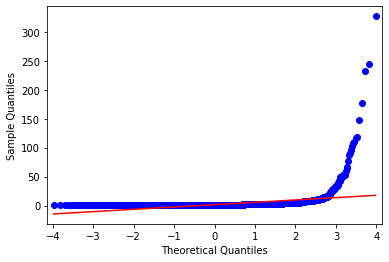

In [129]:
from statsmodels.graphics.gofplots import qqplot

qqplot_data2 = qqplot(df_merged_poor_hosts, line='s').gca().lines

#### From the QQ-Plots below for Pre and Post pandemic we see heavy tails which includes several outliers that appear influential.

In [130]:
fig = go.Figure()

fig.add_trace({
    'type': 'scatter',
    'x': qqplot_data2[0].get_xdata(),
    'y': qqplot_data2[0].get_ydata(),
    'mode': 'markers',
    'marker': {
        'color': '#19d3f3'
    }
})

fig.add_trace({
    'type': 'scatter',
    'x': qqplot_data2[1].get_xdata(),
    'y': qqplot_data2[1].get_ydata(),
    'mode': 'lines',
    'line': {
        'color': '#636efa'
    }

})


fig['layout'].update({
    'title': 'Quantile-Quantile Plot: Poor Neighborhoods',
    'xaxis': {
        'title': 'Theoritical Quantities',
        'zeroline': False
    },
    'yaxis': {
        'title': 'Sample Quantities'
    },
    'showlegend': False,
    'width': 800,
    'height': 700,
})


iplot(fig, filename='normality-QQ')

#### Let us now test for Normality using Shapiro-Wilks Test:

In [39]:
from scipy.stats import shapiro
stat, p = shapiro(df_merged_poor_hosts)

# interpret
alpha = 0.05
if p > alpha:
    msg = 'Sample looks Gaussian (fail to reject H0)'
else:
    msg = 'Sample does not look Gaussian (reject H0)'

result_mat = [
    ['Length of the sample data', 'Test Statistic', 'p-value', 'Comments'],
    [len(df_merged_poor_hosts), stat, p, msg]
]

swt_table = ff.create_table(result_mat)
swt_table['data'][0].colorscale=[[0, '#2a3f5f'],[1, '#ffffff']]
swt_table['layout']['height']=200
swt_table['layout']['margin']['t']=50
swt_table['layout']['margin']['b']=50

iplot(swt_table, filename='shapiro-wilk-table')

C:\Users\kulra\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning:

p-value may not be accurate for N > 5000.



### From the skewed distribution of the poor neighborhood hosts data, the QQ-plot, and the Shapiro-Wilkes test we conclude that our sample is not Normally distributed. 
### Therefore, the assumptions for a parametric two-sample test are violated. Let us now use the methodology of the nonparametric two-sample test. Because our distribution exhibited heavy tails and asymmetry (skewness) as well as clear outliers, we shall perform the Wilcoxon Rank Sum test for the mean calculated host listings for poor neighborhoods. We use this test because ranks tend to make inferences more robust to outliers, and from nonparametric methodology the mean is a better measure of center with the distribution shape we have. Wilcoxon Rank Sum Test tends to have higher power when the distrubution is skewed and when outliers are present than the Permutation Test.

For Wilcoxon rank sum test, we have the assumptions of independence of the samples and equal variance. Because the samples were sampled randomly from the population of Airbnb listings in New York City and that each sample was taken in a different year and filtered by whether the listings have been reviewed in that year alone, we can assume independence. The boxplot below of the samples show that both pre and post pandemic have a similar spread, so we can assume equal variance.

In [51]:
#Boxplot here! (currently in R, but should be made to look nicer)

In [61]:
##### This conclusion seemed suspicious to us, because the p-value being very close to 1 for this one-sided alternative of poor neighborhood mean listings per host are smaller after the pandemic than before indicates that we should rerun the test in the other direction. Additionally our plots  point towards a rejection of the hypothesis, so we shall now test the one-sided alternative hypothesis $F_1(x) \geq F_2(x)$ where poor neighborhood mean listings per host are greater after the pandemic than before. This is performed using an asymptotic Wilcoxon Rank Sum Test in R once again.

Asymptotic Wilcoxon Rank Sum Test (from R): Test statistic: Z = -6.565, p-value = 2.602e-11

In [59]:
#Code from R for Wilcoxon Rank Sum Test:
'''#import data for poor neighborhood pre and post pandemic hypothesis testing

df_merged_poor_hosts2_R <- read.csv("C:/Users/kulra/Desktop/df_merged_poor_hosts2_R.csv")

#View(df_merged_poor_hosts2_R)

groups2 <- as.factor(df_merged_poor_hosts2_R$before_pandemic)
#groups
numbers2 <- df_merged_poor_hosts2_R$calculated_host_listings_count
#numbers

wilcox_test(numbers2 ~ groups2,df_merged_poor_hosts2_R, distribution = "asymptotic",alternative = "less")'''

'#import data for poor neighborhood pre and post pandemic hypothesis testing\n\ndf_merged_poor_hosts2_R <- read.csv("C:/Users/kulra/Desktop/df_merged_poor_hosts2_R.csv")\n\n#View(df_merged_poor_hosts2_R)\n\ngroups2 <- as.factor(df_merged_poor_hosts2_R$before_pandemic)\n#groups\nnumbers2 <- df_merged_poor_hosts2_R$calculated_host_listings_count\n#numbers\n\nwilcox_test(numbers2 ~ groups2,df_merged_poor_hosts2_R, distribution = "asymptotic",alternative = "less")'

#### Because the p-value = $ 2.602e-11 \leq \alpha = 0.05$, we reject the $H_0$. Therefore, at the 5% level, we conclude that the mean listings per host in poor neighborhoods post pandemic is greater than the mean listings per host in poor neighborhoods pre pandemic. 

A possible reason that both rich and poor neighborhoods had growth in the mean listings per host, which means that hosts listed more properties rather than less one year after the start of the pandemic, is that despite having listings in either or both poor and rich neighborhoods, the hosts themselves are almost certainly not poor. To be able to offer even one listing post pandemic may be expensive enough to maintain, let alone more than one. Many hosts may even have listings in both poor and rich neighborhoods, and have profited due to low real estate prices in New York City due to people moving out of the city after the pandemic hit.(Add something abt gig economy)

# Hypothesis Test 3:

## We would like to determine whether mean days of nonzero availability in rich neighborhoods have changed after the pandemic compared to before. We think this claim may be true because after the pandemic hit in December 2019, Airbnb increased the minimum number of nights people should stay at the same place to “[crack] down on the availability of illegal short-term rentals” (Shared Economy Tax, 2019) and data sharing laws, and so hosts would have to offer their listings for a longer period of time. It's possible, however, that hosts did not heed this policy because they can only offer listings for a smaller number of days, because of fear of COVID-19 transmission in their homes, or because they were conducting illegal activities in short-term rental Airbnbs. There could be many factors that we cannot account for. Thus we test for a significant difference in the mean days of nonzero availability for rich neighborhoods.



###  Hypotheses: $$H_0: F_1(x) = F_2(x)$$ $$ H_A: F_1(x) \geq F_2(x), F_1(x) \leq F_2(x),$$
where $F_1(X)$ is the distribution for group 1: rich neighborhood mean days of nonzero availability pre pandemic, and $F_2(x)$ is the distribution for group 2: rich neighborhood mean days of nonzero availability post-pandemic. 

In [76]:
#isolate first sample, pre availability listings in rich neighborhoods
df_pre_available = df_pre_cleaned[df_pre_cleaned.availability_365 > 0]
df_pre_available_rich = df_pre_available.loc[(df_pre_available['rich']==1.0)]
df_pre_available_rich["before_pandemic"]= '1'
pre_available_rich = df_pre_available_rich.availability_365
#df_pre_available_rich
#pre_available_rich

0        355
30       273
37       302
43       294
47       231
        ... 
25098    130
25110     15
25112    358
25113    323
25120    181
Name: availability_365, Length: 1459, dtype: int64

In [78]:
#isolate second sample, post availability listings in rich neighborhoods
df_post_available = df_post_cleaned[df_post_cleaned.availability_365 > 0]
df_post_available_rich = df_post_available.loc[(df_post_available['rich']==1.0)]
df_post_available_rich["before_pandemic"]= '0'
#df_post_available_rich
post_available_rich = df_post_available_rich.availability_365
#post_available_rich

In [79]:
#combine the two data sets of df_pre_cleaned nonzero availability and df_post_cleaned nonzero availability for rich neighborhoods
df_pre_available_rich2 = pre_available_rich.copy()
df_post_available_rich2 = post_available_rich.copy()
frames = [df_pre_available_rich2, df_post_available_rich2]

In [80]:
df_merged_rich_available = pd.concat(frames)
df_merged_rich_available

0        355
30       273
37       302
43       294
47       231
        ... 
16274    320
16279      8
16282     14
16289    162
16294    287
Name: availability_365, Length: 2276, dtype: int64

####  From the below distributions of the rich neighborhood nonzero availability (number of days available greater than 0), it is clear that the distributions for both pre and post pandemic, respectfully, are not Normal in shape.The first distribution, for pre-pandemic rich neighborhoods, is skewed right and has two peaks. The second distribution, for post-pandemic rich neighborhoods, is more skewed to the left, and has a heavy tail. The distributions do not look the same.

In [89]:
trace = go.Histogram(
    x=pre_available_rich 
)
iplot([trace], filename='normality-histogram')


In [90]:
trace = go.Histogram(
    x=post_available_rich 
)
iplot([trace], filename='normality-histogram')


Because these two distributions appear to be different, we will test to see if the two samples are from the same distribution. We will use Kolmogorov-Smirnov Test to find difference in mean days of nonzero availability in rich neighborhoods before and after the pandemic. Under the assumption that the samples are from the same distribution, the samples have been independently sampled in different years, with only listings with reviews in the same year as sampled included in each sample. Therefore the assumptions for Kolmogorov-Smirnov Test have been met.

In [102]:
from scipy.stats import ks_2samp

# perform a two-sample Kolmogorov-Smirnov test
scipy.stats.ks_2samp(pre_available_rich, post_available_rich, alternative='two-sided', mode='auto')

Ks_2sampResult(statistic=0.21493905636143534, pvalue=1.2212453270876722e-15)

From our K-S test, we get a test statistic of 0.21493905636143534 and p-value of 1.2212453270876722e-15. If in reality, the distribution of mean days of nonzero availability before and after the pandemic were the same, we would observe our test statistic or more extreme with probability of almost 0.

Because our p-value= $1.2212453270876722e-15 \leq \alpha = 0.05$, we reject the $H_0$. At the 5% level, we conclude that there is a significant difference in mean days of nonzero availability in rich neighborhoods before and after the pandemic. 

# Hypothesis Test 4:

## We would like to determine whether poor neighborhood mean days of nonzero availability have changed after the pandemic compared to before. For the same reasons as for rich neighborhoods, namely the new policy by the city of New York and Airbnb that requires longer stays by occupants of a listing to prevent illegal activity in short term rentals, but also other factors that we cannot control for. Thus we test for a significant difference in the mean days of nonzero availability for poor neighborhoods.



###  Hypotheses: $$H_0: F_1(x) = F_2(x)$$ $$ H_A: F_1(x) \geq F_2(x), F_1(x) \leq F_2(x),$$
where $F_1(X)$ is the distribution for group 1: poor neighborhood mean days of nonzero availability pre pandemic, and $F_2(x)$ is the distribution for group 2: poor neighborhood mean days of nonzero availability post-pandemic. 

In [107]:
#isolate first sample, pre availability listings in poor neighborhoods
df_pre_available = df_pre_cleaned[df_pre_cleaned.availability_365 > 0]
df_pre_available_poor = df_pre_available.loc[(df_pre_available['rich']==0.0)]
df_pre_available_poor["before_pandemic"]= '1'
pre_available_poor = df_pre_available_poor.availability_365
#df_pre_available_poor
#pre_available_poor

In [118]:
#isolate second sample, post availability listings in poor neighborhoods
df_post_available = df_post_cleaned[df_post_cleaned.availability_365 > 0]
df_post_available_poor = df_post_available.loc[(df_post_available['rich']==0.0)]
df_post_available_poor["before_pandemic"]= '0'
df_post_available_poor
post_available_poor = df_post_available_poor.availability_365
#post_available_poor

In [119]:
#combine the two data sets of df_pre_cleaned nonzero availability and df_post_cleaned nonzero availability for poor neighborhoods
df_pre_available_poor2 = pre_available_poor.copy()
df_post_available_poor2 = post_available_poor.copy()
frames = [df_pre_available_poor2, df_post_available_poor2]

In [120]:
df_merged_poor_available = pd.concat(frames)
df_merged_poor_available

1        194
2        129
3        220
4        188
5          6
        ... 
16330    356
16331    180
16332      7
16333    269
16334    365
Name: availability_365, Length: 32581, dtype: int64

####  From the below distributions of the poor neighborhood nonzero availability (number of days available greater than 0), it is clear that the data for both pre and post pandemic, respectfully, are not Normal in shape.The first distribution, for pre-pandemic poor neighborhoods, is skewed right and has a heavy tail with a relatively large peak. The second distribution, for post-pandemic poor neighborhoods, is skewed strongly to the left, and has a heavy tail with two much smaller peaks. The distributions do not look the same.

In [121]:
trace = go.Histogram(
    x=pre_available_poor 
)
iplot([trace], filename='normality-histogram')


In [123]:
trace = go.Histogram(
    x=post_available_poor 
)
iplot([trace], filename='normality-histogram')


Because these two distributions appear to be different, we will test to see if the two samples are from the same distribution. We will use Kolmogorov-Smirnov Test to find difference in mean days of nonzero availability in poor neighborhoods before and after the pandemic. Under the assumption that the samples are from the same distribution, the samples have been independently sampled in different years, with only listings with reviews in the same year as sampled included in each sample. Therefore the assumptions for Kolmogorov-Smirnov Test have been met.

In [124]:
from scipy.stats import ks_2samp

# perform a two-sample Kolmogorov-Smirnov test
scipy.stats.ks_2samp(pre_available_poor, post_available_poor, alternative='two-sided', mode='auto')

Ks_2sampResult(statistic=0.17175054006270452, pvalue=1.1866766660863536e-194)

From our K-S test, we get a test statistic of 0.17175054006270452 and p-value of 1.1866766660863536e-194. If in reality, the distribution of mean days of nonzero availability before and after the pandemic were the same, we would observe our test statistic or more extreme with probability of almost 0.

Because our p-value= $1.1866766660863536e-194 \leq \alpha = 0.05$, we reject the $H_0$. At the 5% level, we conclude that there is a significant difference in mean days of nonzero availability in poor neighborhoods before and after the pandemic. 